## Introduction

This project uses a Deep Neural Network, more specifically a Convolutional Neural Network, to differentiate between images of people, with masks, without masks and incorrectly placed masks. Manually built and pretrained networks will be used to perform this classification task.

**Face-Mask-Detection-Using-CNN**

* Outbreak of the Coronavirus pandemic has created various changes in the lifestyle of everyone around the world.
* Among these changes, wearing a mask has been very vital to every individual.
* Detection of people who are not wearing masks is a challenge due to the large populations.
* This face mask detection project can be used in schools, hospitals, banks, airports etc as a digitalized scanning tool.
  - The technique of detecting people’s faces and segregating them into three classes namely the people with masks and people without masks and partial masks is done with the help of image processing and deep learning.
* With the help of this project, a person who is monitoring the face mask status for a particular firm can be seated in a remote area and still monitor efficiently and give instructions accordingly.

![img](https://cdn.iisc.talentsprint.com/CDS/MiniProjects/dataset-images-with-mask.jpg)

## Dataset

The data for this mini-project is collected from various sources including the masked images from internet and general frontal face images considered as without mask. This dataset consists of 5029 train images and 1059 test images with 3 classes `with_mask`, `without_mask` and `partial_mask`

Many people are not correctly wearing their masks due to bad practices, bad behaviors or vulnerability of individuals (e.g., children, old people). For these reasons, several mask wearing campaigns intend to sensitize people about this problem and good practices. In this sense, this work proposes three types of masked face detection dataset
  
- Without Mask/ With Mask/ Partial Mask
  
Note that this dataset contains some annotated (artificially generated) masks to augment the 'masked' data category.

## Problem Statement

To build and implement a Convolutional Neural Network model to classify between masked/unmasked/partially masked faces.

### Import Required packages

In [ ]:
import PIL
import glob, os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from sklearn.utils import shuffle
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.utils import plot_model, image_dataset_from_directory

import keras.utils as image
from keras.applications.vgg16 import VGG16
from keras.models import load_model, Model, Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint
from keras.layers import Conv2D, Input, ZeroPadding2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense,Dropout


### Analyzing the shape and distribution of datasets [1]

In [ ]:

# defining path names for futur use
data_dir = '/content/MP2_FaceMask_Dataset'

train_partial_path = data_dir + '/train/partial_mask'
train_on_path = data_dir + '/train/with_mask'
train_off_path = data_dir + '/train/without_mask'

test_partial_path = data_dir + '/test/partial_mask'
test_on_path = data_dir + '/test/with_mask'
test_off_path = data_dir + '/test/without_mask'

list_training_paths = [train_partial_path, train_on_path, train_off_path]
list_testing_paths = [test_partial_path, test_on_path, test_off_path]

In [ ]:
# View a sample image using PIL
sample_image = train_partial_path + '/51000_Mask_Mouth_Chin.jpg'
# Open image using Image module
train_image = PIL.Image.open(sample_image)
# Size of the image
print(train_image.size)
# Channels of the image
print(train_image.mode)

(1024, 1024)
RGB


In [ ]:
# View a sample image using PIL
sample_image = test_partial_path + '/51014_Mask_Mouth_Chin.jpg'
# Open image using Image module
test_image = PIL.Image.open(sample_image)
# Size of the image
print(test_image.size)
# Channels of the image
print(test_image.mode)

(1024, 1024)
RGB


In [ ]:
# Store the dimensions of all training images
df_train_dimensions = pd.DataFrame(columns=['height', 'width', 'channels'])
for training_path in list_training_paths:
  for image_file in os.listdir(training_path):
    image = PIL.Image.open(training_path + '/' + image_file)
    d1,d2 = image.size
    colour_channels = len(image.mode)
    row_to_append = pd.DataFrame([{'height' : d1, 'width' : d2, 'channels' : colour_channels}])
    df_train_dimensions = pd.concat([df_train_dimensions, row_to_append])

df_train_dimensions.head()

,height,width,channels
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3


In [ ]:
# Explore the image dataframe
df_train_dimensions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5056 entries, 0 to 0
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   height    5056 non-null   object
 1   width     5056 non-null   object
 2   channels  5056 non-null   object
dtypes: object(3)
memory usage: 158.0+ KB


In [ ]:
# convert all columns to int and then see descriptive statistics
df_train_dimensions = df_train_dimensions.astype('int')
df_train_dimensions.describe()

,height,width,channels
count,5056.000000,5056.000000,5056.0
mean,434.440269,449.378560,3.0
std,387.447702,396.837981,0.0
min,110.000000,141.000000,3.0
25%,160.000000,160.000000,3.0
50%,160.000000,160.000000,3.0
75%,1024.000000,1024.000000,3.0
max,3456.000000,4608.000000,3.0


In [ ]:
# Store the dimensions of all testing images
df_test_dimensions = pd.DataFrame(columns=['height', 'width', 'channels'])
for testing_path in list_testing_paths:
  for image_file in os.listdir(testing_path):
    img = PIL.Image.open(testing_path + '/' + image_file)
    d1,d2 = img.size
    colour_channels = len(image.mode)
    row_to_append = pd.DataFrame([{'height' : d1, 'width' : d2, 'channels' : colour_channels}])
    df_test_dimensions = pd.concat([df_test_dimensions, row_to_append])

df_test_dimensions.head()

,height,width,channels
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3
0,1024,1024,3


In [ ]:
# Explore the image dataframe
df_test_dimensions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1263 entries, 0 to 0
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   height    1263 non-null   object
 1   width     1263 non-null   object
 2   channels  1263 non-null   object
dtypes: object(3)
memory usage: 39.5+ KB


In [ ]:
# convert all columns to int and then see descriptive statistics
df_test_dimensions = df_test_dimensions.astype('int')
df_test_dimensions.describe()

,height,width,channels
count,1263.000000,1263.000000,1263.0
mean,438.878068,449.840063,3.0
std,387.920760,395.294796,0.0
min,110.000000,141.000000,3.0
25%,160.000000,160.000000,3.0
50%,166.000000,168.000000,3.0
75%,1024.000000,1024.000000,3.0
max,3456.000000,5184.000000,3.0


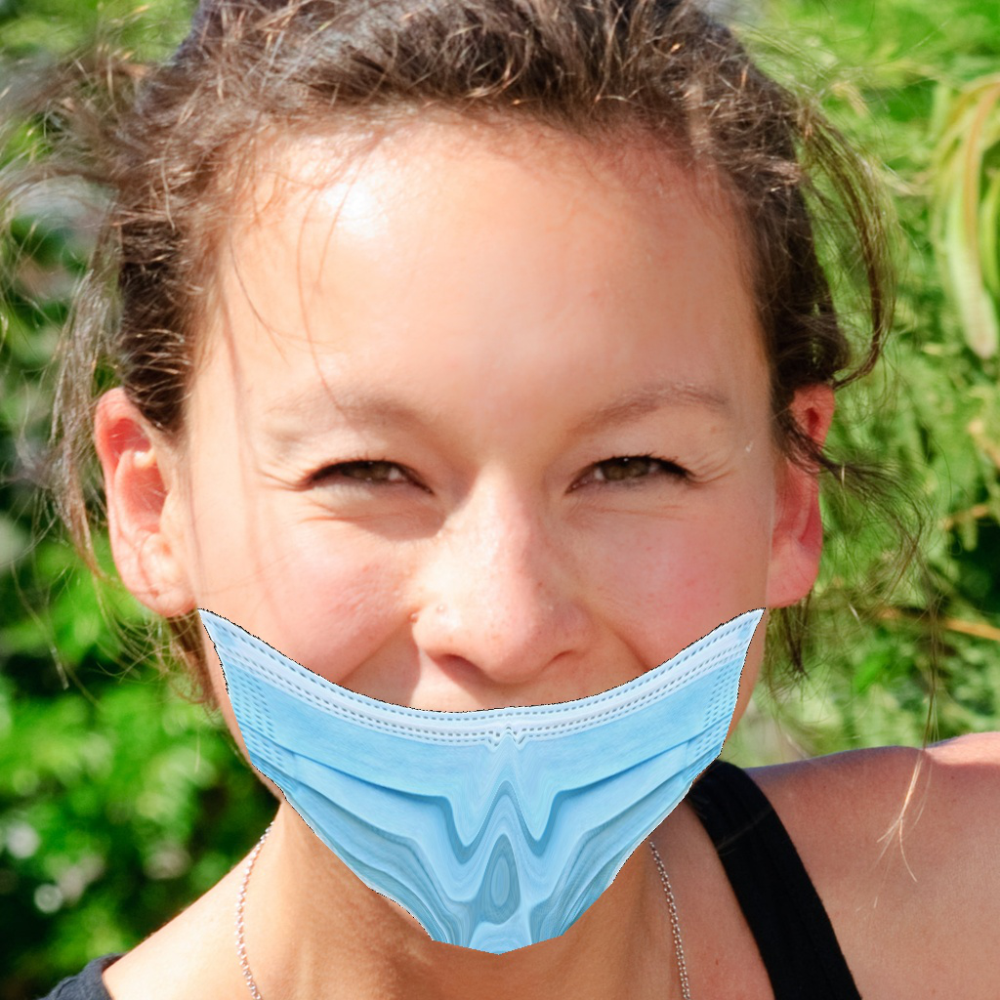

In [ ]:

train_image.show()

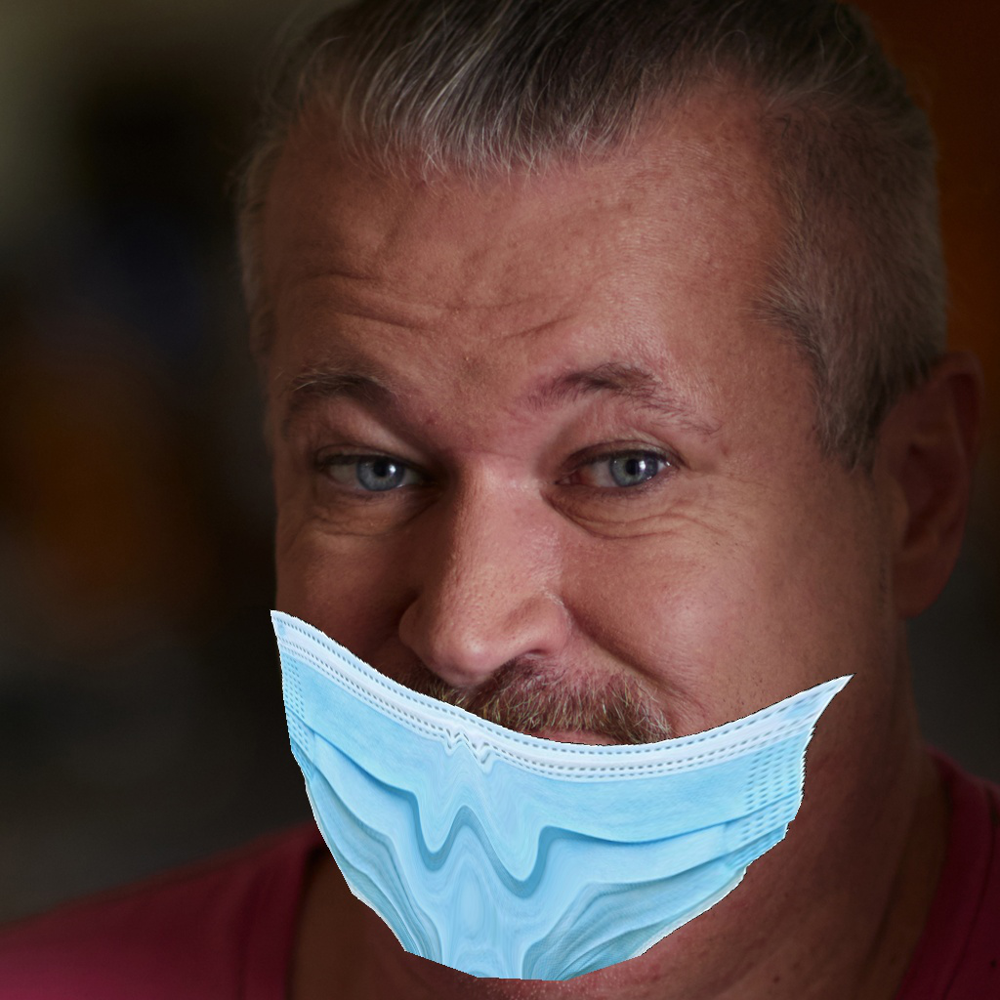

In [ ]:

test_image.show()

In [ ]:
train_path = "/content/MP2_FaceMask_Dataset/train/"
test_path = "/content/MP2_FaceMask_Dataset/test/"

In [ ]:
# convert image data on disk to tensor format;
# ImageDataGenerator ignores all files that are not jpeg, png, gif etc
# rescale each pixel to between 0 & 1 as well as split the training data into training-validation in 80-20
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_generator = train_datagen.flow_from_directory(train_path, target_size=(180, 180), batch_size=32, class_mode='binary', subset='training')
val_generator = train_datagen.flow_from_directory(train_path, target_size=(180, 180), batch_size=32, class_mode='binary', subset='validation')

Found 4025 images belonging to 3 classes.
Found 1004 images belonging to 3 classes.


In [ ]:
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(test_path, target_size=(180, 180), batch_size=32, class_mode='binary')

Found 1259 images belonging to 3 classes.


Check class indices

In [ ]:
print(f"train_dataset = {train_generator.class_indices}")
print(f"val_dataset = {val_generator.class_indices}")
print(f"test_dataset = {test_generator.class_indices}")

train_dataset = {'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}
val_dataset = {'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}
test_dataset = {'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}


Check the shape of the image from train_generator

In [ ]:
next(train_generator)[0].shape

(32, 180, 180, 3)

In [ ]:
next(train_generator)[1].shape

(32,)

### Visualize the sample images of each class using data generator [1]

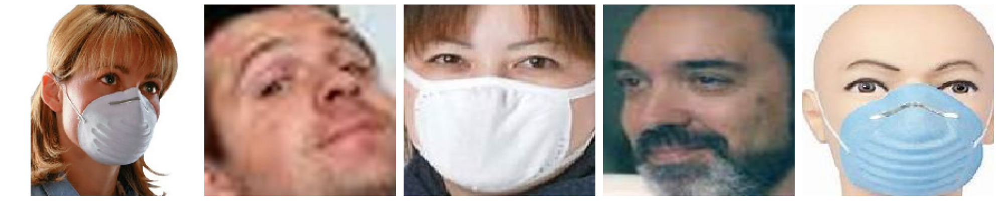

In [ ]:
sample_training_images, _ = next(train_generator)
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_training_images[:5])

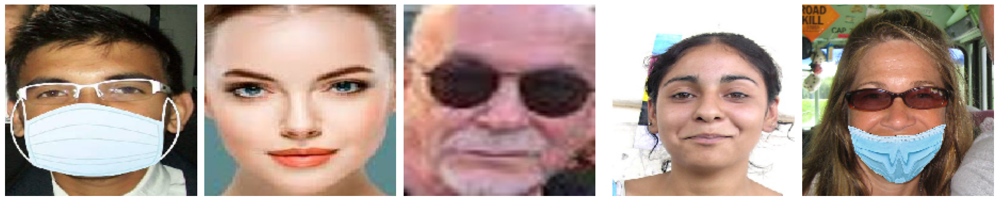

In [ ]:
sample_validation_images, _ = next(val_generator)
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_validation_images[:5])

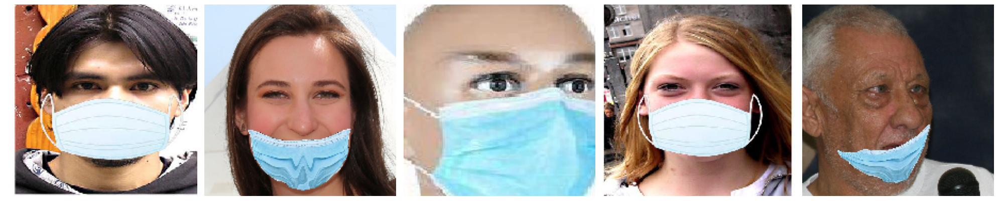

In [ ]:
sample_testing_images, _ = next(test_generator)
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_testing_images[:5])

## Build the CNN model using Keras [1]



**Convolutional Neural Network:** A neural network in which at least one layer is a convolutional layer. A typical convolutional neural network consists of some combination of the following layers:

* convolutional layers
* pooling layers
* dense layers


**Conv2D**  

Passing an image with input shape of 3-D and to calculate the output:

 $O = \frac{n - f + 2p}{s} + 1$

 where

 $n$ = image dimension

 $f$ = filter size

 $p$ = padding

 $s$ = stride

**MaxPool**

The resulting output, when using the "valid" padding option, has a spatial shape (number of rows or columns) of:

O = `math.floor`$(\frac{input shape - pool size)}{ strides}) + 1$ (when input shape >= pool size)

The resulting output shape when using the "same" padding option is:

O = `math.floor`$(\frac{input shape - 1}{strides}) + 1$

by default, stride = None, so stride is same as pool size

Task-flow
* Initialize the network of convolution, maxpooling and dense layers
* Define the optimizer and loss functions
* Fit the model and evaluate the model

**model 1 with 2 convolutional (feature representation) and 2 maxpool layers (down sampling) and 2 dense layers for classification.**

In [ ]:
model1 = Sequential([
    # First convolutional layer
    Conv2D(100, (3,3), activation='relu', input_shape = (180, 180, 3)),
    MaxPooling2D((2,2)),
    # Second convolutional layer
    Conv2D(100, (3,3), activation='relu'),
    MaxPooling2D((2,2)),
    # Flatten layer to convert 2D feature maps to 1D feature vectors
    Flatten(),
    # First dense layer
    Dense(256, activation='relu'),
    # Output dense layer with 3 units for 3 classes and softmax activation for classification
    Dense(3, activation='softmax')
])

In [ ]:
#Note: Applying a convolution to an image will make it smaller (if no padding).
#Convolving a 3x3 filter over images means we’ll lose a single pixel on all sides (2 in total).
#In the given case, sliding a 3x3 filter over a 224x224 image results in a 222x222 image
# Compile the model
model1.compile(optimizer='rmsprop',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 178, 178, 100)     2800      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 100)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 100)       90100     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 43, 43, 100)      0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 184900)            0         
                                                                 
 dense (Dense)               (None, 256)               4

Fit the data to the model

In [ ]:
# fit the model
history = model1.fit(train_generator, epochs=10, steps_per_epoch=126, validation_data= val_generator, validation_steps=32)

Epoch 1/10
126/126 [==============================] - 57s 354ms/step - loss: 1.3861 - accuracy: 0.8164 - val_loss: 0.2417 - val_accuracy: 0.9044
Epoch 2/10
126/126 [==============================] - 39s 306ms/step - loss: 0.2029 - accuracy: 0.9443 - val_loss: 0.2406 - val_accuracy: 0.9203
Epoch 3/10
126/126 [==============================] - 54s 433ms/step - loss: 0.1454 - accuracy: 0.9565 - val_loss: 0.2068 - val_accuracy: 0.9432
Epoch 4/10
126/126 [==============================] - 44s 349ms/step - loss: 0.1119 - accuracy: 0.9665 - val_loss: 0.2349 - val_accuracy: 0.9223
Epoch 5/10
126/126 [==============================] - 38s 300ms/step - loss: 0.0740 - accuracy: 0.9771 - val_loss: 0.2129 - val_accuracy: 0.9442
Epoch 6/10
126/126 [==============================] - 41s 329ms/step - loss: 0.0882 - accuracy: 0.9796 - val_loss: 0.4134 - val_accuracy: 0.9104
Epoch 7/10
126/126 [==============================] - 38s 301ms/step - loss: 0.0253 - accuracy: 0.9925 - val_loss: 0.2550 - val_ac

Plot training and validation loss

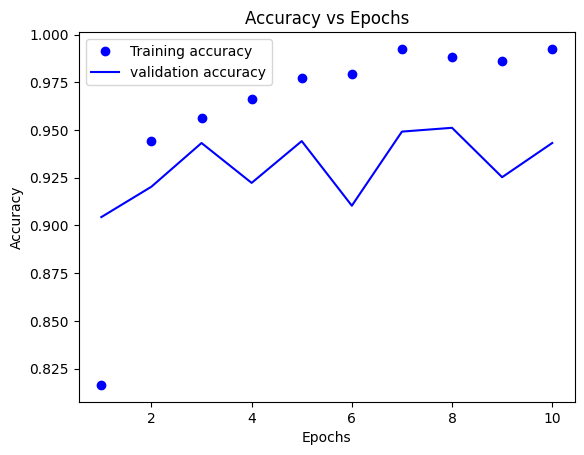

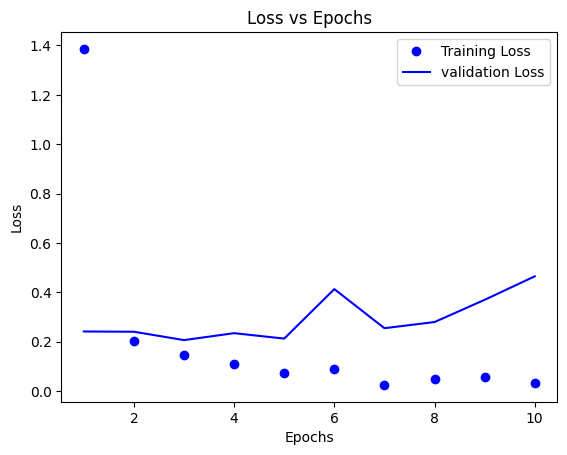

In [ ]:
data = pd.DataFrame(history.history)
epochs = range(1,len(data)+1)
plt.plot(epochs,data['accuracy'],'bo',label="Training accuracy")
plt.plot(epochs,data['val_accuracy'],'b',label="validation accuracy")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Epochs")
plt.figure()
plt.plot(epochs,data['loss'],'bo',label="Training Loss")
plt.plot(epochs,data['val_loss'],'b',label="validation Loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs Epochs")

plt.show()

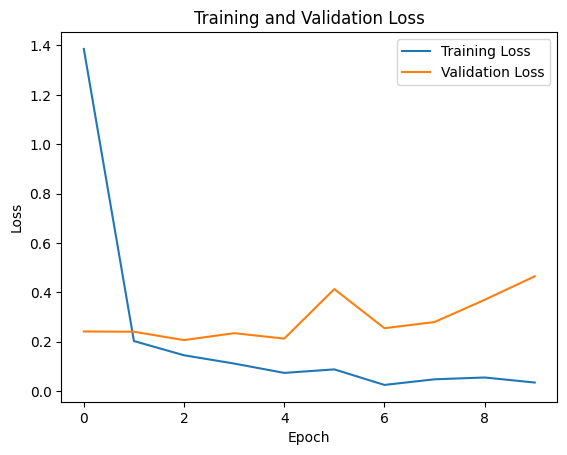

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [ ]:
test_loss, test_acc = model1.evaluate(test_generator)
print(f"Test metrics:{test_loss:.3f}, {test_acc:.3f}")

40/40 [==============================] - 9s 234ms/step - loss: 0.3031 - accuracy: 0.9603
Test metrics:0.303, 0.960


** Save and Reload Model**

https://www.tensorflow.org/guide/keras/save_and_serialize

**model 2 with few more conv layers**

Task-flow
* Initialize the network of convolution, maxpooling and dense layers
* Define the optimizer and loss functions
* Drefine callback list including tensor board.
* Fit the model and evaluate the model

Define Callbacks

In [ ]:
# Define a function to return a commmonly used callback_list
def def_callbacks(filepath, mod_chk_mon = "val_loss", tensorboard = True, earlystop = 0 ):
    callback_list = []

    # Defualt callback
    callback_list.append(ModelCheckpoint(filepath,
                                         save_best_only = True,
                                         monitor=mod_chk_mon))
    if tensorboard:
      log_dir = "tensorLog_" + filepath
      callback_list.append(TensorBoard(log_dir=log_dir))

    if earlystop>0:
       callback_list.append(EarlyStopping(patience=earlystop))

    return callback_list

Define the model

In [ ]:
model2 = Sequential([
    # First convolutional layer
    Conv2D(128, (3,3), activation='relu', input_shape = (180, 180, 3)),
    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D((2,2)),
    Conv2D(256, (3,3), activation='relu'),
    MaxPooling2D((2,2)),
    Conv2D(512, (3,3), activation='relu'),
    MaxPooling2D((2,2)),
    # Flatten layer to convert 2D feature maps to 1D feature vectors
    Flatten(),
    # Dense layers
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    # Output dense layer with 3 units for 3 classes and softmax activation for classification
    Dense(3, activation='softmax')
])

Compile the model

In [ ]:
model2.compile(optimizer='rmsprop',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 178, 178, 128)     3584      
                                                                 
 conv2d_3 (Conv2D)           (None, 176, 176, 128)     147584    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 88, 88, 128)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 86, 86, 256)       295168    
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 43, 43, 256)      0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 41, 41, 512)      

Fit the data to the model

In [ ]:
history_2 = model2.fit(train_generator, epochs=10, steps_per_epoch=126, validation_data= val_generator, validation_steps=32, callbacks= def_callbacks("model2_similar2_vgg16"))

Epoch 1/10
126/126 [==============================] - ETA: 0s - loss: 1.4985 - accuracy: 0.5518

126/126 [==============================] - 76s 510ms/step - loss: 1.4985 - accuracy: 0.5518 - val_loss: 0.3456 - val_accuracy: 0.8835
Epoch 2/10
126/126 [==============================] - 51s 405ms/step - loss: 0.2763 - accuracy: 0.9168 - val_loss: 0.4907 - val_accuracy: 0.8705
Epoch 3/10
126/126 [==============================] - ETA: 0s - loss: 0.1992 - accuracy: 0.9463

126/126 [==============================] - 53s 418ms/step - loss: 0.1992 - accuracy: 0.9463 - val_loss: 0.2188 - val_accuracy: 0.9402
Epoch 4/10
126/126 [==============================] - ETA: 0s - loss: 0.1550 - accuracy: 0.9513

126/126 [==============================] - 54s 424ms/step - loss: 0.1550 - accuracy: 0.9513 - val_loss: 0.1243 - val_accuracy: 0.9562
Epoch 5/10
126/126 [==============================] - 53s 417ms/step - loss: 0.1167 - accuracy: 0.9605 - val_loss: 0.2447 - val_accuracy: 0.9452
Epoch 6/10
126/126 [==============================] - 53s 422ms/step - loss: 0.1251 - accuracy: 0.9684 - val_loss: 0.2419 - val_accuracy: 0.9442
Epoch 7/10
126/126 [==============================] - 50s 392ms/step - loss: 0.0760 - accuracy: 0.9784 - val_loss: 0.2135 - val_accuracy: 0.9492
Epoch 8/10
126/126 [==============================] - 53s 421ms/step - loss: 0.1540 - accuracy: 0.9759 - val_loss: 0.1794 - val_accuracy: 0.9582
Epoch 9/10
126/126 [==============================] - 53s 419ms/step - loss: 0.0932 - accuracy: 0.9799 - val_loss: 0.3726 - val_accuracy: 0.9223
Epoch 10/10
126/126 [==============================] - 47s 376ms/step - loss: 0.0446 - accuracy: 0.9901 - val_loss: 0.3640 - val_accuracy: 0.

Plot training and validation loss

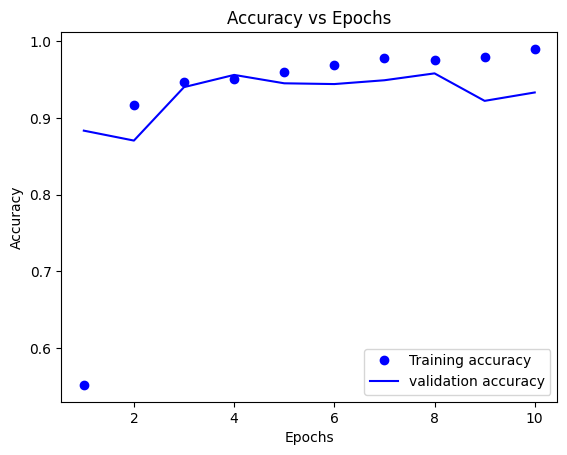

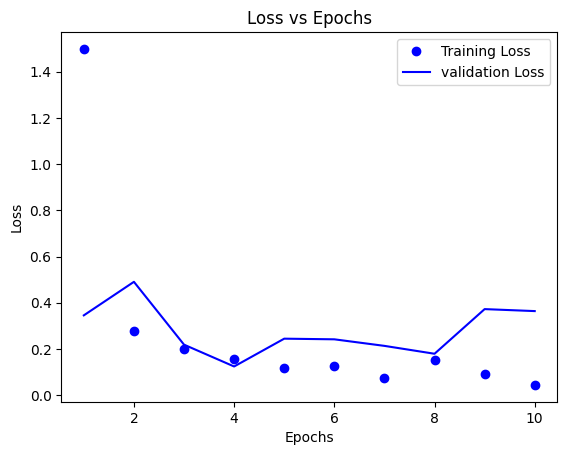

In [ ]:
data = pd.DataFrame(history_2.history)
epochs = range(1,len(data)+1)
plt.plot(epochs,data['accuracy'],'bo',label="Training accuracy")
plt.plot(epochs,data['val_accuracy'],'b',label="validation accuracy")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Epochs")
plt.figure()
plt.plot(epochs,data['loss'],'bo',label="Training Loss")
plt.plot(epochs,data['val_loss'],'b',label="validation Loss")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs Epochs")

plt.show()

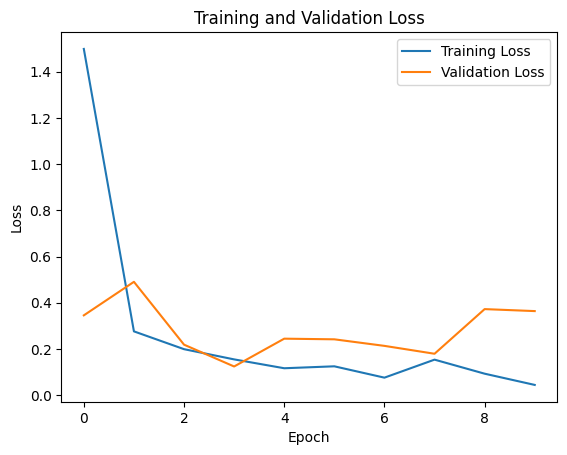

In [ ]:
plt.plot(history_2.history['loss'], label='Training Loss')
plt.plot(history_2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

Display Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/tensorLog_model2_similar2_vgg16

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
test_loss, test_acc = model2.evaluate(test_generator)
print(f"Test metrics:{test_loss:.3f}, {test_acc:.3f}")

40/40 [==============================] - 12s 302ms/step - loss: 0.1713 - accuracy: 0.9651
Test metrics:0.171, 0.965


## Prediction on a random test image

In [ ]:
sample_image = next(test_datagen.flow_from_directory(test_path, target_size=(180, 180), batch_size=1, class_mode='binary'))[0]
model2.predict(sample_image)

Found 1259 images belonging to 3 classes.
1/1 [==============================] - 0s 332ms/step


array([[1.4260185e-09, 1.0000000e+00, 5.3297757e-08]], dtype=float32)

## Visualization [2]

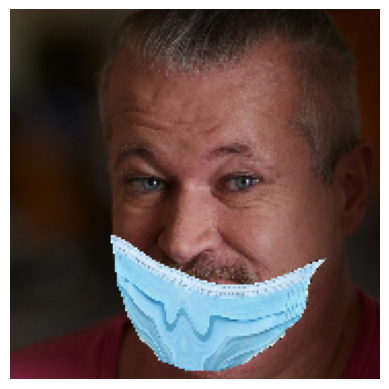

In [ ]:
img_path = '/content/MP2_FaceMask_Dataset/test/partial_mask/51014_Mask_Mouth_Chin.jpg'
target_size = (299, 299)

# Preprocessing a single image
def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img) # converts image to np array

    array = np.expand_dims(array, axis=0)     #Its shape is now (1, 180, 180, 3)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180)) #resize image

plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

## Instantiating a model that returns "layer activations"

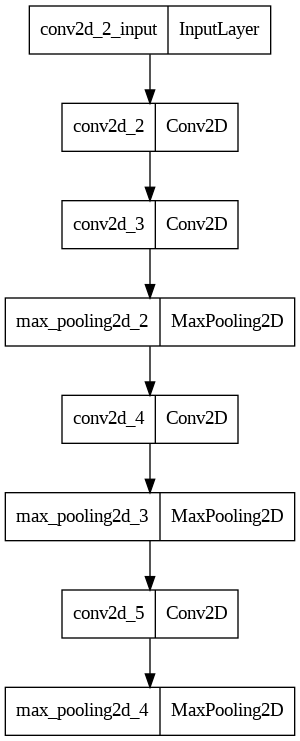

In [ ]:
# Instantiating a model that returns "layer activations"
layer_outputs = []
layer_names = []
for layer in model2.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)

activation_model = keras.Model(inputs=model2.input, outputs=layer_outputs)
plot_model(activation_model)

Once the activation model is defined, predict the image tensor created using this model.

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 178, 178, 128)     3584      
                                                                 
 conv2d_3 (Conv2D)           (None, 176, 176, 128)     147584    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 88, 88, 128)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 86, 86, 256)       295168    
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 43, 43, 256)      0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 41, 41, 512)      

In [ ]:
# Compute layer activations
activations = activation_model.predict(img_tensor)
print(f"No. of outputs= {len(activations)}")

first_layer_feature_maps = activations[0]    # Q: why is this the first layer's activation? A: index 0
print(f"first_layer_activation.shape= {first_layer_feature_maps.shape}")

1/1 [==============================] - 0s 112ms/step
No. of outputs= 7
first_layer_activation.shape= (1, 178, 178, 128)


## Visualize first feature map

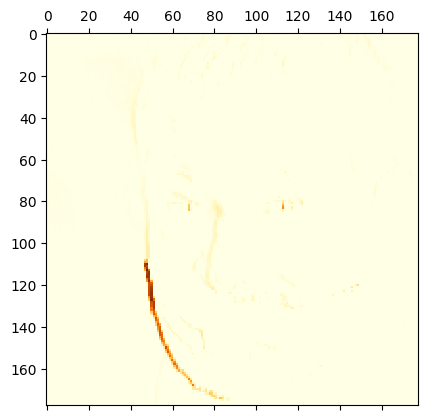

In [ ]:
# Visualise activation
plt.matshow(first_layer_feature_maps[0, :, :, 5], cmap="YlOrBr")

## Visualize feature map after each layer

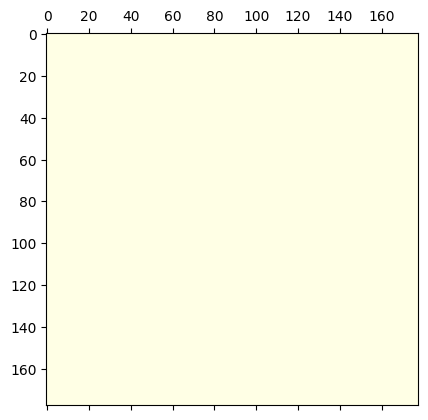

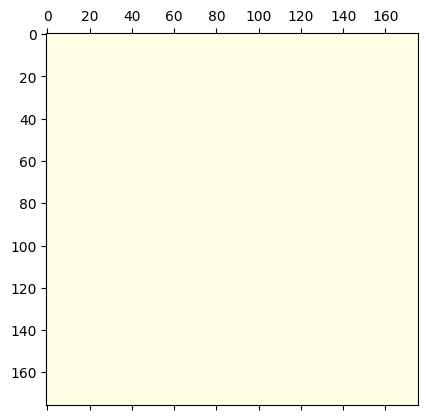

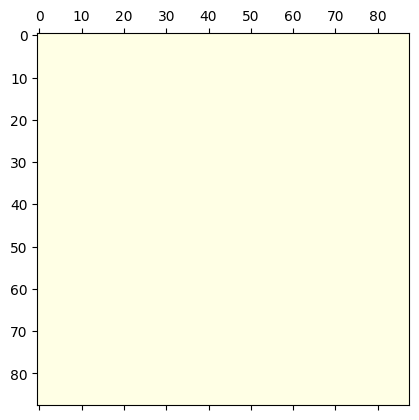

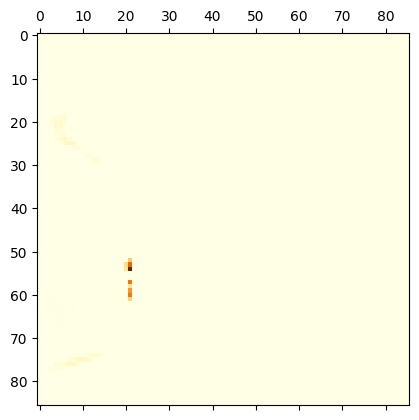

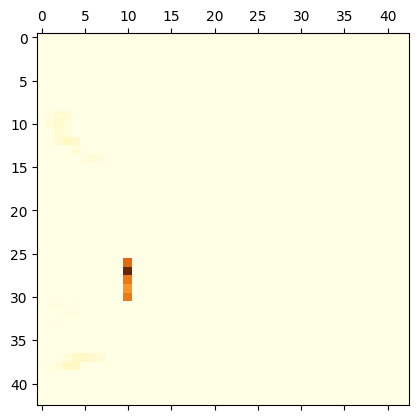

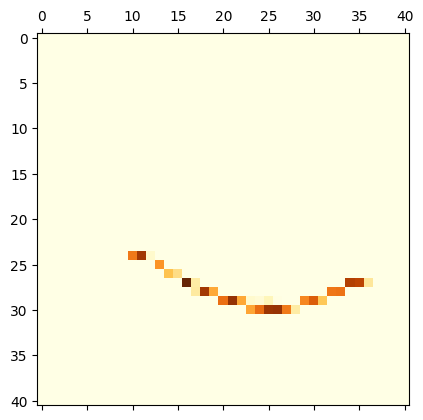

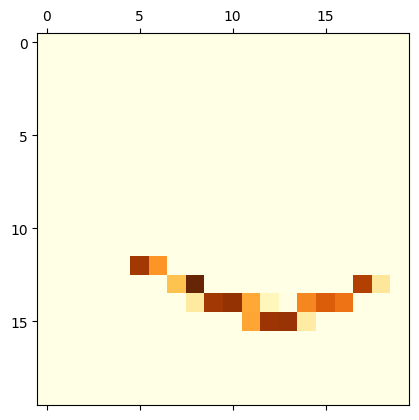

In [ ]:

for i in range(len(activations)):
   plt.matshow(activations[i][0, :, :, 2], cmap="YlOrBr")

Successive feature maps are of smaller dimensions but scaled to be the same size during visualization.

## Visualise all the feature maps of all the layers

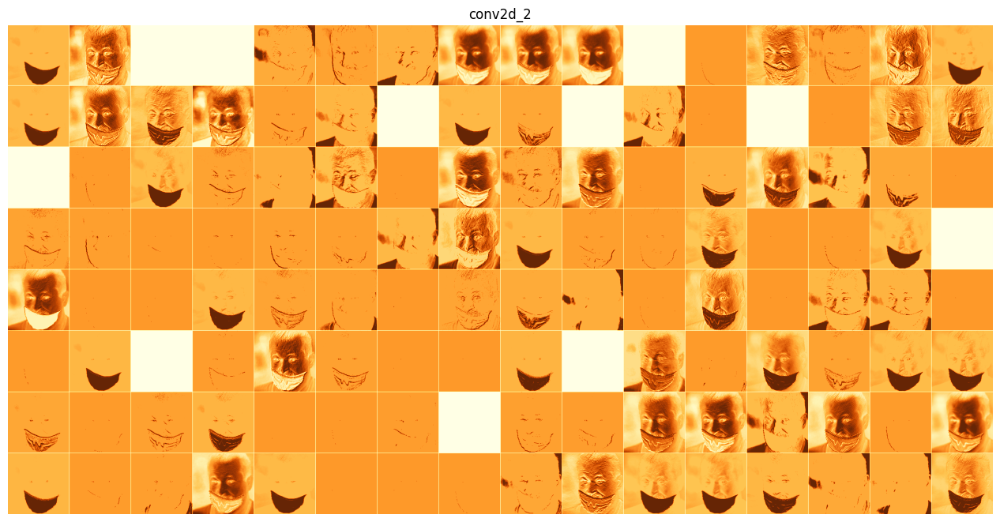

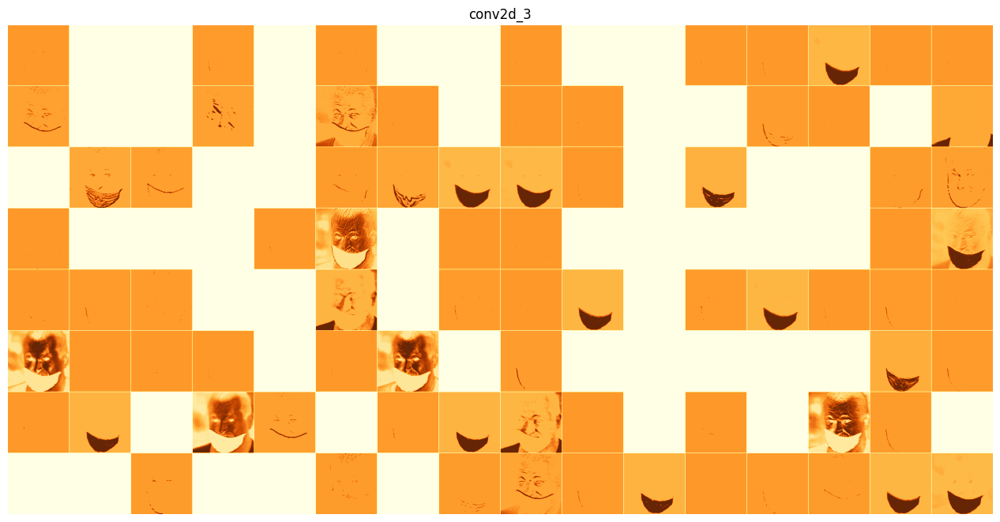

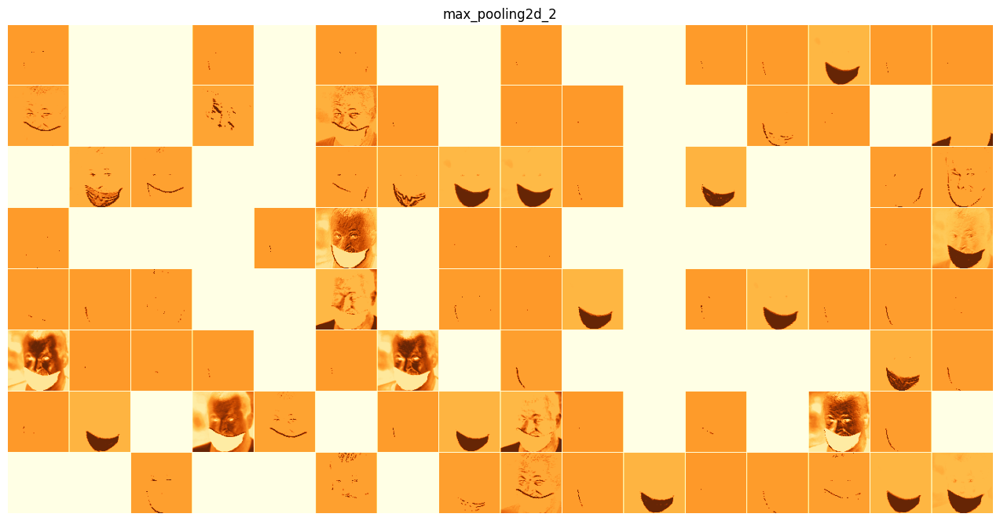

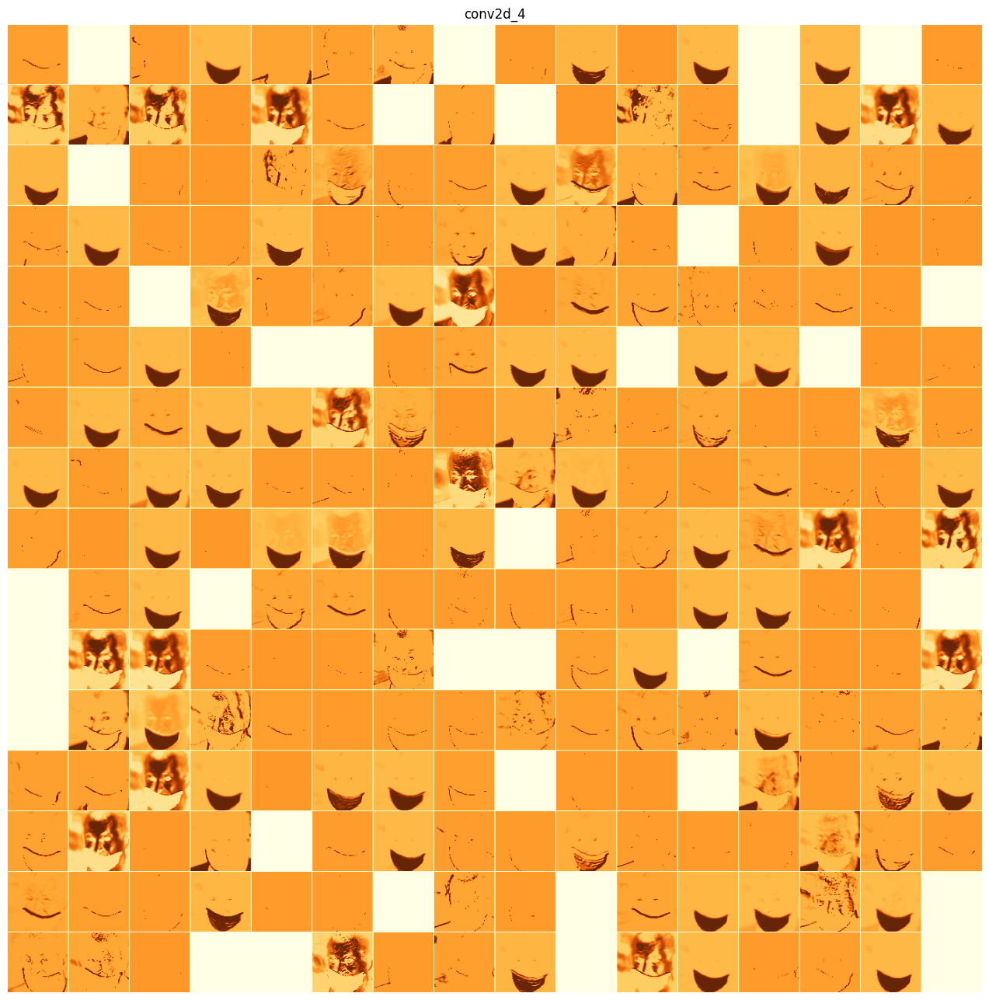

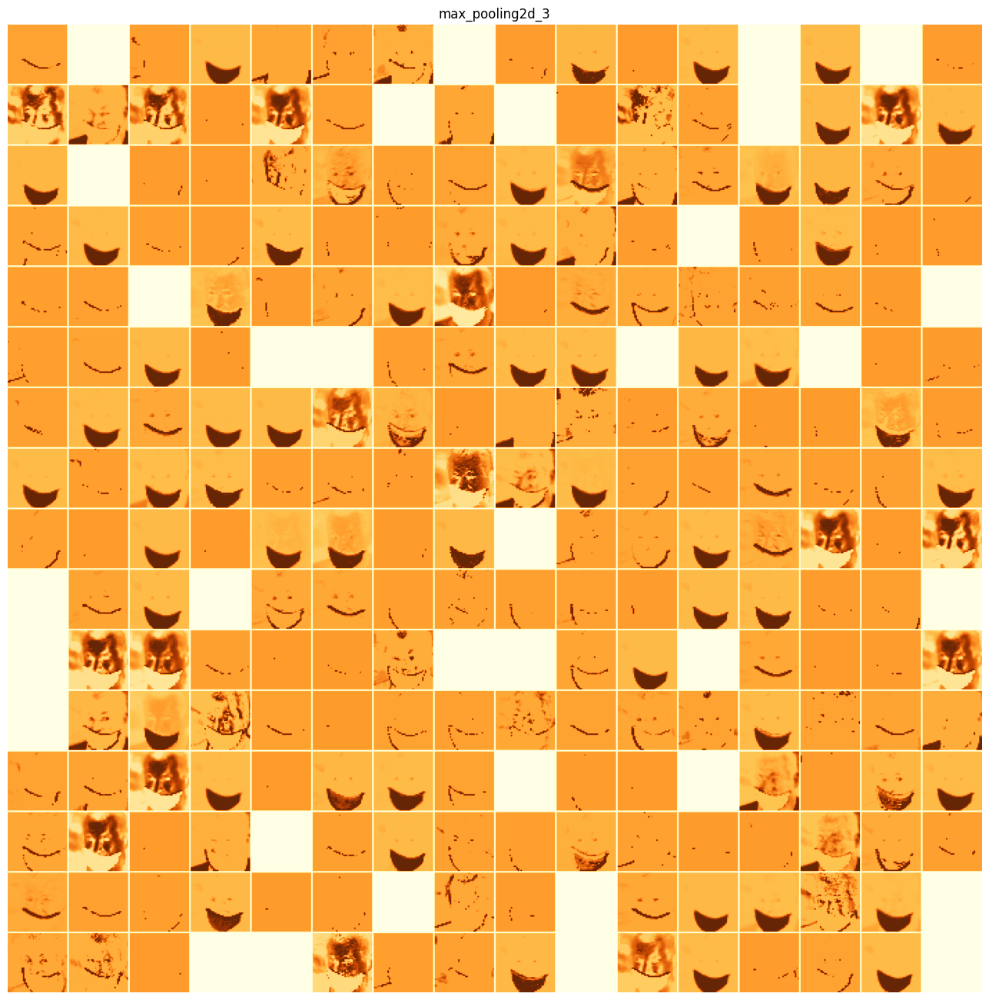

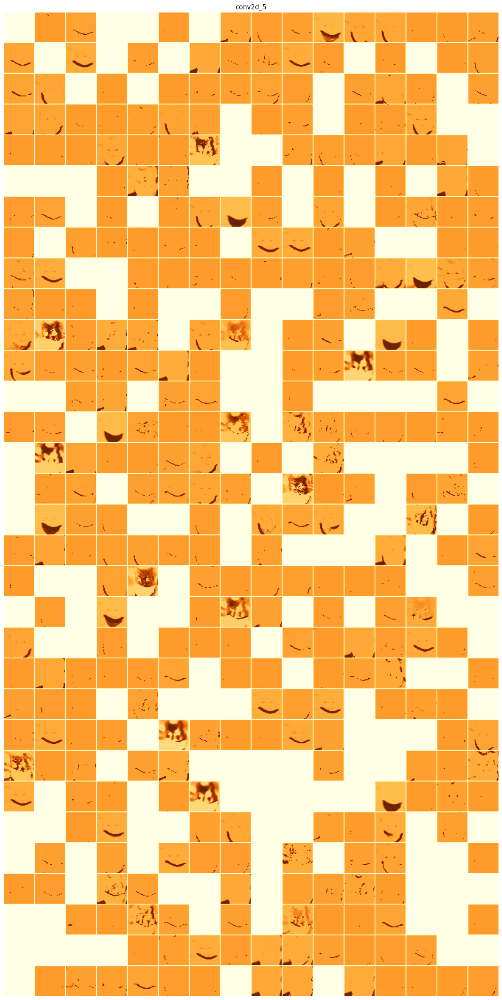

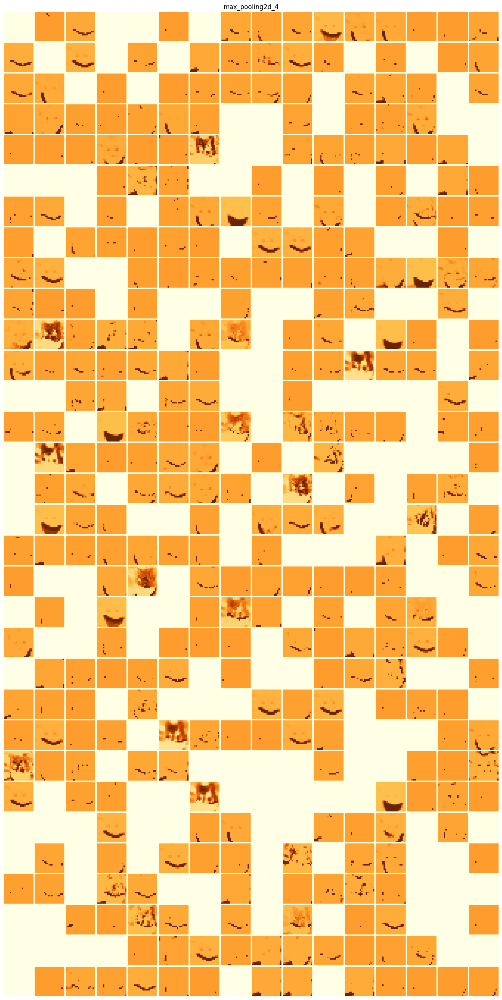

In [ ]:
# Post-processing code - only visualizaton
# Visualizing every channel in every intermediate activation

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="YlOrBr")

# ConvNet Filters [1]

In [ ]:

for layer in model2.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D)):
        print(layer.name)

conv2d_2
conv2d_3
max_pooling2d_2
conv2d_4
max_pooling2d_3
conv2d_5
max_pooling2d_4


## Create a feature extractor model

In [ ]:
layer_name = "max_pooling2d_2"
layer = model2.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model2.input, outputs=layer.output)

feature_extractor.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2_input (InputLayer)  [(None, 180, 180, 3)]    0         
                                                                 
 conv2d_2 (Conv2D)           (None, 178, 178, 128)     3584      
                                                                 
 conv2d_3 (Conv2D)           (None, 176, 176, 128)     147584    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 88, 88, 128)      0         
 2D)                                                             
                                                                 
Total params: 151,168
Trainable params: 151,168
Non-trainable params: 0
_________________________________________________________________


## Use the feature extractor model to extract feature out of the image tensor.

In [ ]:
activation = feature_extractor(keras.applications.xception.preprocess_input(img_tensor))

In [ ]:
def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

## Loss maximization via stochastic gradient ascent.


In [ ]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

## Define a function to generate filter visualizations

In [ ]:
img_width = 180
img_height = 180

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

## Define a function to convert a tensor into a valid image

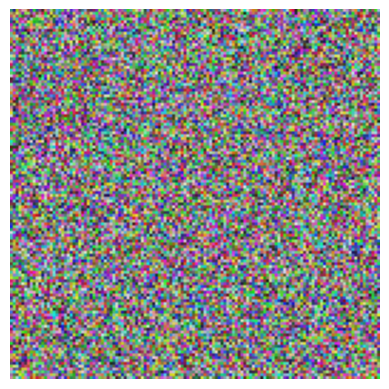

In [ ]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

In [ ]:
# Post processing- Just visualization
# Generating a grid of all filter response patterns in a layer
all_images = []
for filter_index in range(64):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)

margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = image

keras.utils.save_img(f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

<Figure size 4000x4000 with 0 Axes>

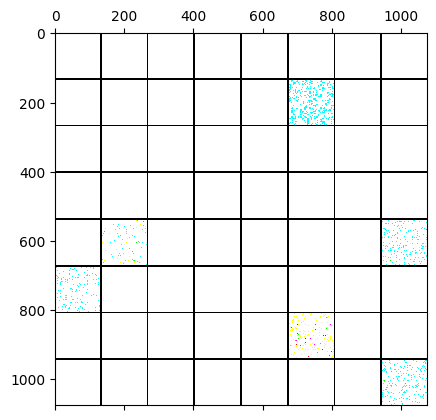

In [ ]:
plt.figure(figsize=(40,40))
plt.matshow(stitched_filters)

Display the images

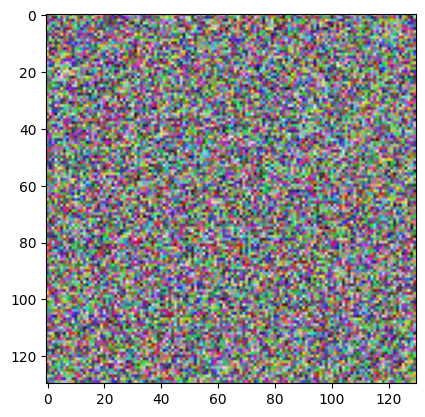

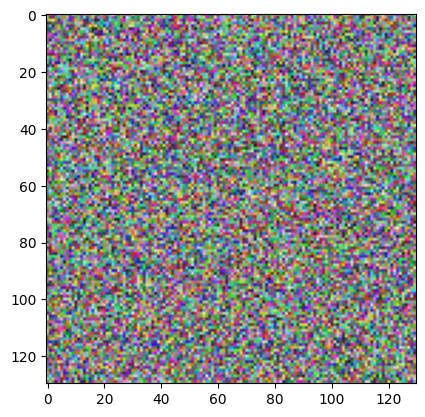

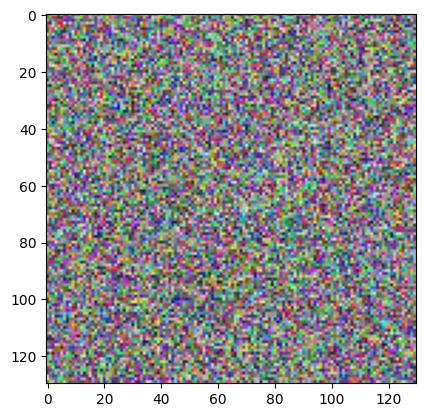

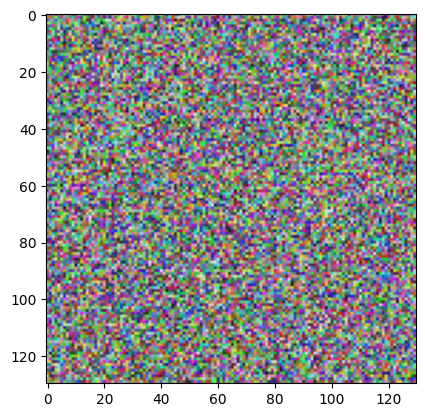

In [ ]:
for i in [0,8,16,32]:
  plt.figure()
  plt.imshow((all_images[i]))

## Transfer learning [2]

Transfer learning consists of taking features learned on one problem, and leveraging them on a new, similar problem.

A pre-trained model is a saved network that was previously trained on a large dataset, typically on a large-scale image-classification task.

The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. You can then take advantage of these learned feature maps without having to start from scratch by training a large model on a large dataset.

For eg. Using VGG16, we remove the last layer which takes a probability for each of the 1000 classes in the ImageNet and replaces it with a layer that takes 3 probabilities in our case.

#### VGG16

Define the pre-trained vgg model with dense layers.

Display the model summary

In [ ]:
base_model_vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(180, 180, 3))

# Create a new model on top of the base model
model_vgg16 = Sequential()
model_vgg16.add(base_model_vgg16)
model_vgg16.add(Flatten())
model_vgg16.add(Dense(64, activation='relu'))
model_vgg16.add(Dense(3, activation='softmax'))
model_vgg16.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 flatten_6 (Flatten)         (None, 12800)             0         
                                                                 
 dense_14 (Dense)            (None, 64)                819264    
                                                                 
 dense_15 (Dense)            (None, 3)                 195       
                                                                 
Total params: 15,534,147
Trainable params: 15,534,147
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Compile the model
model_vgg16.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

Fit the data to the model

In [ ]:
history_vgg16 = model_vgg16.fit(train_generator, epochs=3, steps_per_epoch=126, validation_data= val_generator, validation_steps=32)

Epoch 1/3
126/126 [==============================] - 57s 412ms/step - loss: 0.6231 - accuracy: 0.7714 - val_loss: 0.2959 - val_accuracy: 0.9163
Epoch 2/3
126/126 [==============================] - 49s 389ms/step - loss: 0.1602 - accuracy: 0.9506 - val_loss: 0.1319 - val_accuracy: 0.9562
Epoch 3/3
126/126 [==============================] - 47s 373ms/step - loss: 0.1156 - accuracy: 0.9625 - val_loss: 0.2635 - val_accuracy: 0.9442


Plot training and validation loss

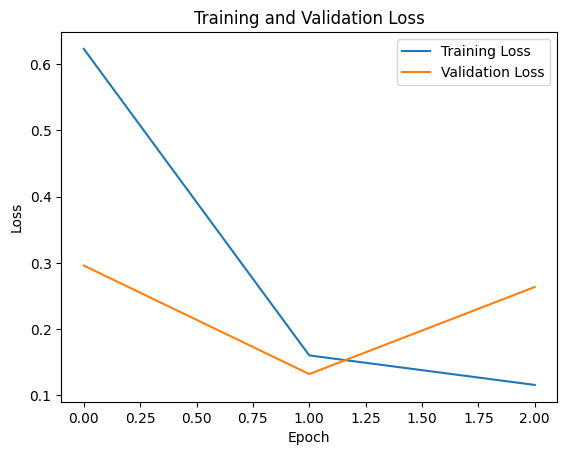

In [ ]:
plt.plot(history_vgg16.history['loss'], label='Training Loss')
plt.plot(history_vgg16.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

#### ResNet50

Define the pre-trained resnet model with dense layers

In [ ]:
base_model_resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=(180, 180, 3))

# Create a new model on top of the base model
model_resnet50 = Sequential()
model_resnet50.add(base_model_resnet50)
model_resnet50.add(Flatten())
model_resnet50.add(Dense(256, activation='relu'))
model_resnet50.add(Dense(128, activation='relu'))
model_resnet50.add(Dense(3, activation='softmax'))
model_resnet50.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 6, 6, 2048)        23587712  
                                                                 
 flatten_8 (Flatten)         (None, 73728)             0         
                                                                 
 dense_19 (Dense)            (None, 256)               18874624  
                                                                 
 dense_20 (Dense)            (None, 128)               32896     
                                                                 
 dense_21 (Dense)            (None, 3)                 387       
                                                                 
Total params: 42,495,619
Trainable params: 42,442,499
Non-trainable params: 53,120
_________________________________________________________________


Fit the data to the model

In [ ]:
model_resnet50.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_resnet50 = model_resnet50.fit(train_generator, epochs=3, steps_per_epoch=126, validation_data= val_generator, validation_steps=32)

Epoch 1/3
126/126 [==============================] - 93s 441ms/step - loss: 1.0372 - accuracy: 0.9222 - val_loss: 2.3435 - val_accuracy: 0.4253
Epoch 2/3
126/126 [==============================] - 52s 411ms/step - loss: 0.1252 - accuracy: 0.9645 - val_loss: 1.1115 - val_accuracy: 0.4253
Epoch 3/3
126/126 [==============================] - 51s 400ms/step - loss: 0.0703 - accuracy: 0.9794 - val_loss: 1.1695 - val_accuracy: 0.4482


Plot the validation and training loss

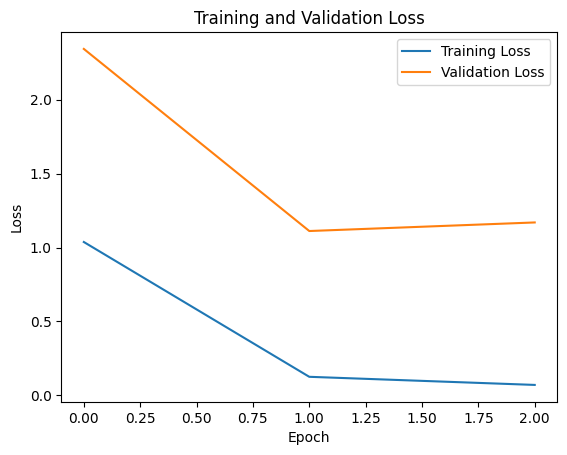

In [ ]:
plt.plot(history_resnet50.history['loss'], label='Training Loss')
plt.plot(history_resnet50.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

### Capture the live image using the below code cell and predict

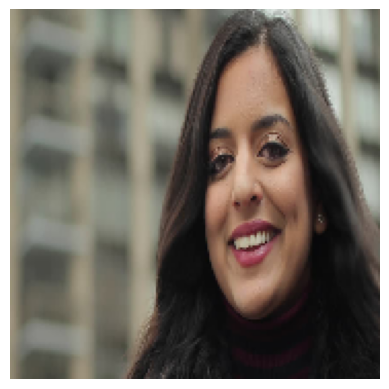

In [ ]:
# Make a prediction using model that is created by making use of transer learning technique
# img_path = '/content/photo.jpg'
img_partial_path = '/content/MP2_FaceMask_Dataset/test/partial_mask/51014_Mask_Mouth_Chin.jpg'
img_with_path = '/content/MP2_FaceMask_Dataset/test/with_mask/111-with-mask.jpg'
img_without_path = '/content/MP2_FaceMask_Dataset/test/without_mask/11.jpg'
target_size = (180, 180)


# Preprocessing a single image
def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img) # converts image to np array

    array = np.expand_dims(array, axis=0)     #Its shape is now (1, 180, 180, 3)
    return array

img_partial_tensor = get_img_array(img_partial_path, target_size=(180, 180)) #resize image
img_with_tensor = get_img_array(img_with_path, target_size=(180, 180)) #resize image
img_without_tensor = get_img_array(img_without_path, target_size=(180, 180)) #resize image

plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

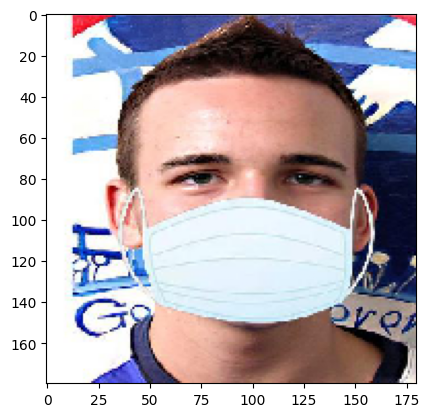

(1, 180, 180, 3)
1/1 [==============================] - 0s 28ms/step
Prediction is: [0]


In [ ]:
newimg_path = "/content/MP2_FaceMask_Dataset/test/with_mask/114-with-mask.jpg"
img = image.load_img(newimg_path, target_size=(180, 180))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
plt.show()
print(img_tensor.shape)

# predicting images
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])
prediction = np.argmax(model_vgg16.predict(images),axis=1)
print("Prediction is:",prediction)

In [ ]:
# predict using model_vgg16, model_resnet50

prediction = np.argmax(model_vgg16.predict(img_partial_tensor),axis=1)
print("model_vgg16 for Partial Prediction is:",prediction)

prediction = np.argmax(model_resnet50.predict(img_partial_tensor),axis=1)
print("model_resnet50 for Partial Prediction is:",prediction)

prediction = np.argmax(model_vgg16.predict(img_with_tensor),axis=1)
print("model_vgg16 for With Mask Prediction is:",prediction)

prediction = np.argmax(model_resnet50.predict(img_with_tensor),axis=1)
print("model_resnet50 for With Mask Prediction is:",prediction)

prediction = np.argmax(model_vgg16.predict(img_without_tensor),axis=1)
print("model_vgg16 for Without Mask Prediction is:",prediction)

prediction = np.argmax(model_resnet50.predict(img_without_tensor),axis=1)
print("model_resnet50 for Without Mask Prediction is:",prediction)

1/1 [==============================] - 0s 22ms/step
model_vgg16 for Partial Prediction is: [0]
1/1 [==============================] - 0s 24ms/step
model_resnet50 for Partial Prediction is: [0]
1/1 [==============================] - 0s 22ms/step
model_vgg16 for With Mask Prediction is: [1]
1/1 [==============================] - 0s 28ms/step
model_resnet50 for With Mask Prediction is: [0]
1/1 [==============================] - 0s 21ms/step
model_vgg16 for Without Mask Prediction is: [1]
1/1 [==============================] - 0s 28ms/step
model_resnet50 for Without Mask Prediction is: [1]
